<a href="https://colab.research.google.com/github/prachsk/Marklund_Lab/blob/main/Marklund_Lab/Trial_1/Python_NB/Ulrika_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Install require packages
!pip install numpy
!pip install scanpy
!pip install pandas
!pip install leidenalg
!pip install anndata2ri
!pip install louvain

In [ ]:
# Import packages
import numpy as np
import pandas as pd
import scanpy as sc
import anndata2ri
import leidenalg
import louvain

In [ ]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.1 anndata==0.7.6 umap==0.5.1 numpy==1.19.5 scipy==1.4.1 pandas==1.1.5 scikit-learn==0.22.2.post1 statsmodels==0.10.2 python-igraph==0.9.6 louvain==0.7.0 pynndescent==0.5.4


In [ ]:
# Result file to write
results_file = '/content/drive/MyDrive/Lab/Computations/Trial_1/Write/adata.h5ad'

In [ ]:
# Activate the anndata2ri conversion between SingleCellExperiment and AnnData
anndata2ri.activate()

#Loading the rpy2 extension enables cell magic to be used
#This runs R code in jupyter notebook cells
%load_ext rpy2.ipython

sc.settings.verbosity = 3
sc.logging.print_versions()

The `sinfo` package has changed name and is now called `session_info` to become more discoverable and self-explanatory. The `sinfo` PyPI package will be kept around to avoid breaking old installs and you can downgrade to 0.3.2 if you want to use it without seeing this message. For the latest features and bug fixes, please install `session_info` instead. The usage and defaults also changed slightly, so please review the latest README at https://gitlab.com/joelostblom/session_info.
-----
anndata     0.7.6
scanpy      1.8.1
sinfo       0.3.4
-----
2f7ece400a652629565c523b34ee61b04afa385c    NA
PIL                                         7.1.2
absl                                        NA
anndata2ri                                  1.0.6
astor                                       0.8.1
astunparse                                  1.6.3
bottleneck                                  1.3.2
cached_property                             1.5.2
certifi                                     2021.05.30


In [ ]:
# Read P21_1 data as adata_1
adata_1 = sc.read_10x_mtx("/content/drive/MyDrive/Lab/Computations/Trial_1/Data/ens_data_update/GSE149524_RAW/P21_1", var_names='gene_symbols', cache=True)
adata_1

... writing an h5ad cache file to speedup reading next time


In [ ]:
# Read P21_2 data as adata_2
adata_2 = sc.read_10x_mtx("/content/drive/MyDrive/Lab/Computations/Trial_1/Data/ens_data_update/GSE149524_RAW/P21_2", var_names='gene_symbols', cache=True)
adata_2

... writing an h5ad cache file to speedup reading next time


In [ ]:
# Concatenate adata1 and adata2 into adata
adata = adata_1.concatenate(adata_2)
adata

In [ ]:
# Make genes names unique
adata.var_names_make_unique()

In [ ]:
adata

AnnData object with n_obs × n_vars = 9140 × 27998
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

normalizing counts per cell
    finished (0:00:00)


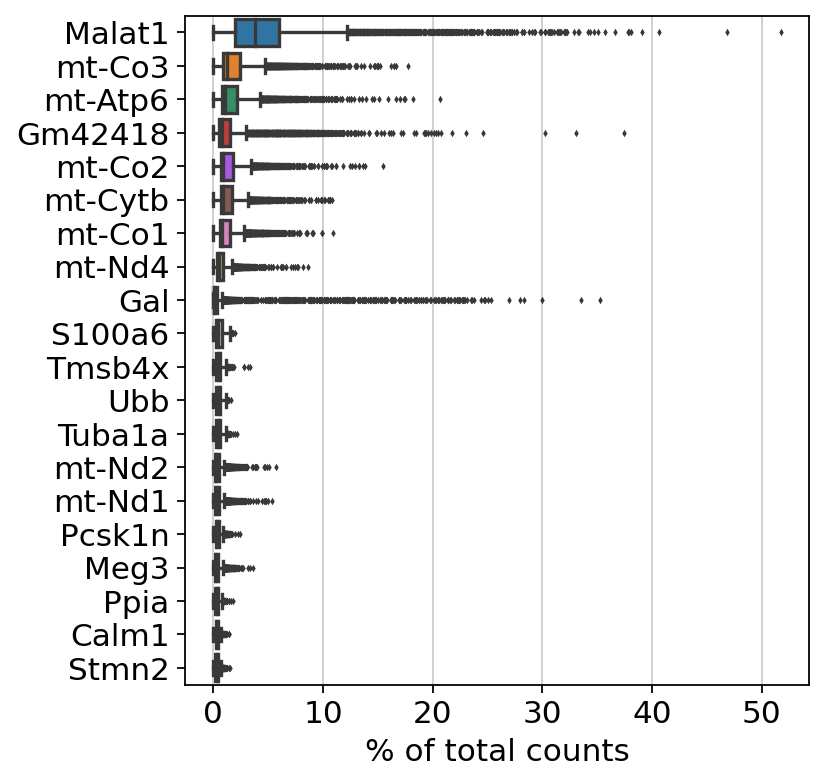

In [ ]:
# Visualize top 20 highly expressed genes
sc.pl.highest_expr_genes(adata, n_top=20, )

In [ ]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 9081 genes that are detected in less than 3 cells


In [ ]:
adata

AnnData object with n_obs × n_vars = 9140 × 18917
    obs: 'batch', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells'

In [ ]:
# Calculate the pecent of mt gene
adata.var['mt'] = adata.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

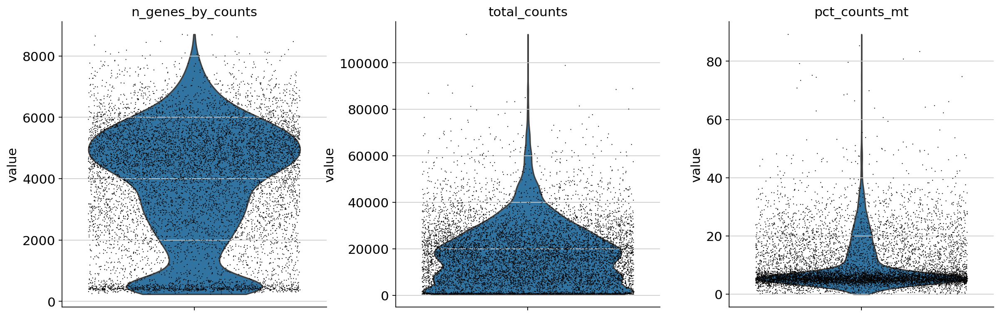

In [ ]:
# Visualize QC with violine plot
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

In [ ]:
# Subset the. data
adata = adata[adata.obs.n_genes_by_counts < 8000, :]
adata = adata[adata.obs.pct_counts_mt < 40, :]

In [ ]:
# Normalize the counts
sc.pp.normalize_total(adata, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [ ]:
# Log transform
sc.pp.log1p(adata)

In [ ]:
# Find highly variable genes
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


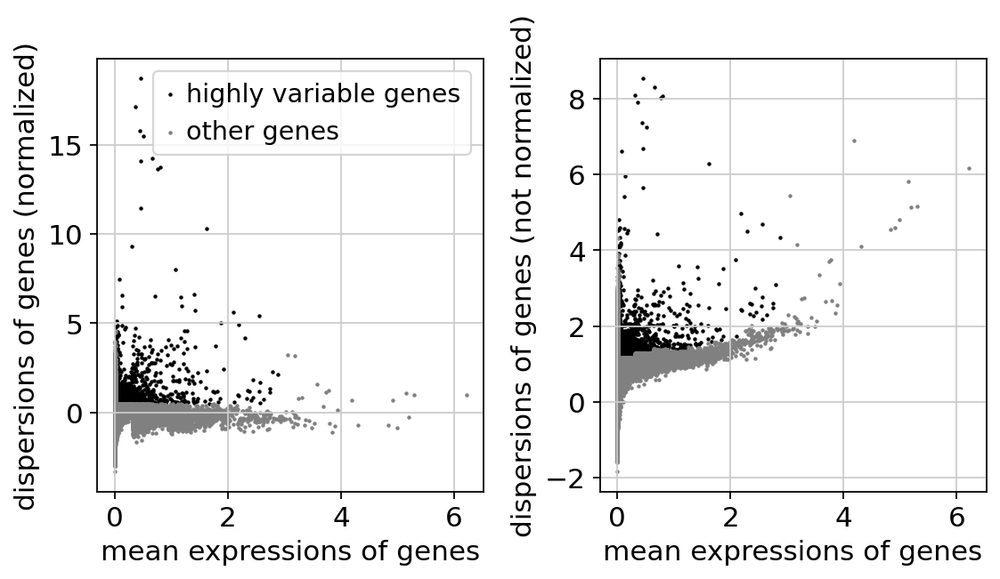

In [ ]:
# Visualize highly variable genes
sc.pl.highly_variable_genes(adata)

In [ ]:
adata.raw = adata

In [ ]:
# Filtering of highly variable genes
adata = adata[:, adata.var.highly_variable]

In [ ]:
# Regress out total_count and pct_mt
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [ ]:
# Perform scaling
sc.pp.scale(adata, max_value=10)

/usr/local/lib/python3.7/dist-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [ ]:
adata

AnnData object with n_obs × n_vars = 9140 × 3327
    obs: 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [ ]:
adata.X

array([[ 0.3022876 ,  0.24181499, -0.2188581 , ..., -0.7048358 ,
        -0.32935044,  0.08434375],
       [ 0.22167423, -0.75256187, -0.2188581 , ...,  0.47656363,
         0.1888327 ,  0.19186787],
       [ 0.5731243 , -0.75256187, -0.2188581 , ...,  0.6803556 ,
         0.7181375 ,  0.78385437],
       ...,
       [ 1.3544716 , -0.75256187, -0.2188581 , ...,  0.09646762,
         0.2602235 , -0.10798213],
       [-0.9244522 , -0.75256187, -0.2188581 , ...,  0.39100355,
        -2.4146159 ,  0.5895387 ],
       [-0.9244522 , -0.75256187, -0.2188581 , ...,  0.44107863,
         0.54097754,  0.6411072 ]], dtype=float32)

In [ ]:
adata.var

,gene_ids,feature_types,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
Mrpl15,ENSMUSG00000033845,Gene Expression,5243,False,5243,1.461816,42.636761,13361.0,True,0.566388,1.324695,0.585248,0.424739,0.459450
Oprk1,ENSMUSG00000025905,Gene Expression,4022,False,4022,2.324836,55.995624,21249.0,True,0.930103,1.614799,0.912336,0.574215,0.763013
Prex2,ENSMUSG00000048960,Gene Expression,609,False,609,0.094967,93.336980,868.0,True,0.103141,1.485323,0.912801,0.052504,0.239898
Tram1,ENSMUSG00000025935,Gene Expression,3483,False,3483,0.564223,61.892779,5157.0,True,0.310440,1.180406,0.524956,0.216835,0.357078
Eya1,ENSMUSG00000025932,Gene Expression,775,False,775,0.124617,91.520788,1139.0,True,0.071458,1.184726,0.530451,0.045435,0.180228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Gfra1,ENSMUSG00000025089,Gene Expression,2675,False,2675,1.183698,70.733042,10819.0,True,0.615462,1.711823,1.559776,0.337395,0.616945
mt-Atp8,ENSMUSG00000064356,Gene Expression,7551,True,7551,3.885886,17.385120,35517.0,True,1.370392,1.982316,2.011738,1.046323,0.747452
mt-Nd3,ENSMUSG00000064360,Gene Expression,8387,True,8387,15.587418,8.238512,142469.0,True,2.560921,2.762009,1.667078,2.150030,0.946202
mt-Nd4l,ENSMUSG00000065947,Gene Expression,8334,True,8334,16.413675,8.818381,150021.0,True,2.552869,2.521389,1.199487,2.198675,0.910569


In [ ]:
adata.obs

,batch,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCCACAGTCGCAC-1-0,0,5433,5433,26419.0,1162.0,4.398350
AAACCCAGTAGGTACG-1-0,0,3814,3814,14427.0,972.0,6.737367
AAACCCATCGAACTCA-1-0,0,4931,4931,20205.0,2241.0,11.091314
AAACCCATCGCCTCTA-1-0,0,5044,5043,24650.0,1216.0,4.933063
AAACGAAAGATGCAGC-1-0,0,2890,2890,8803.0,421.0,4.782461
...,...,...,...,...,...,...
TTTGTTGCAGGTGGAT-1-1,1,3360,3358,8856.0,1827.0,20.630081
TTTGTTGTCAGCACCG-1-1,1,3096,3096,8355.0,1395.0,16.696589
TTTGTTGTCAGGCGAA-1-1,1,7274,7273,59484.0,3658.0,6.149553
TTTGTTGTCCCTCATG-1-1,1,621,621,875.0,31.0,3.542857


In [ ]:
# Run PCA with default parameters
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


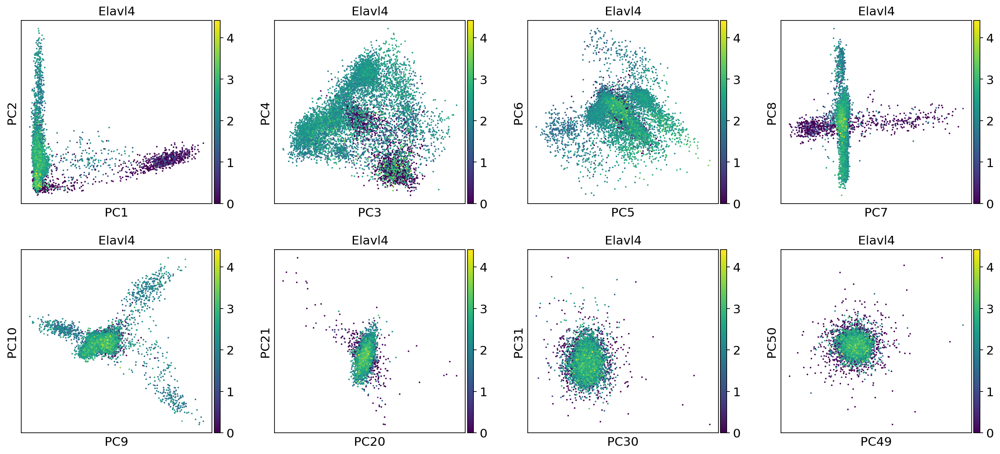

In [ ]:
# Visualized each PC on the expression of a key marker Elavl4
sc.pl.pca(adata,  components=['1,2', '3,4', '5,6', '7,8', '9,10', '20,21', '30,31', '49,50'],color='Elavl4')

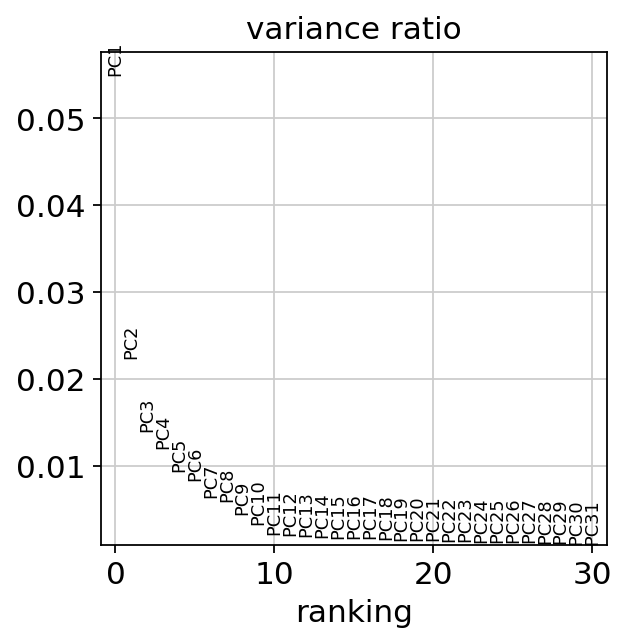

In [ ]:
sc.pl.pca_variance_ratio(adata, log=False)

In [ ]:
# Save adata obj to result file
adata.write(results_file)

In [ ]:
# Find Neighbor
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

computing neighbors
    using 'X_pca' with n_pcs = 30


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)


In [ ]:
# Find cluster with leiden method
sc.tl.leiden(adata, resolution=1.2)

running Leiden clustering
    finished: found 25 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [ ]:
# Run UMAP and Visualize
sc.tl.umap(adata, min_dist=.5, spread=1.0)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


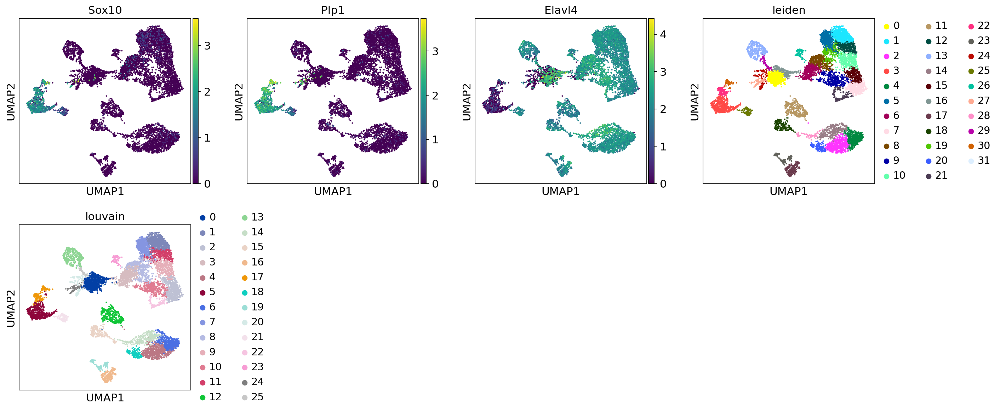

In [ ]:
sc.pl.umap(adata, color=['Sox10', 'Plp1', 'Elavl4', 'leiden', 'leiden'])

In [ ]:
# Find cluster with louvain method
sc.tl.louvain(adata, resolution=1.8)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 26 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


In [ ]:
# Run t-SNE and visualize
sc.tl.tsne(adata)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:01:17)


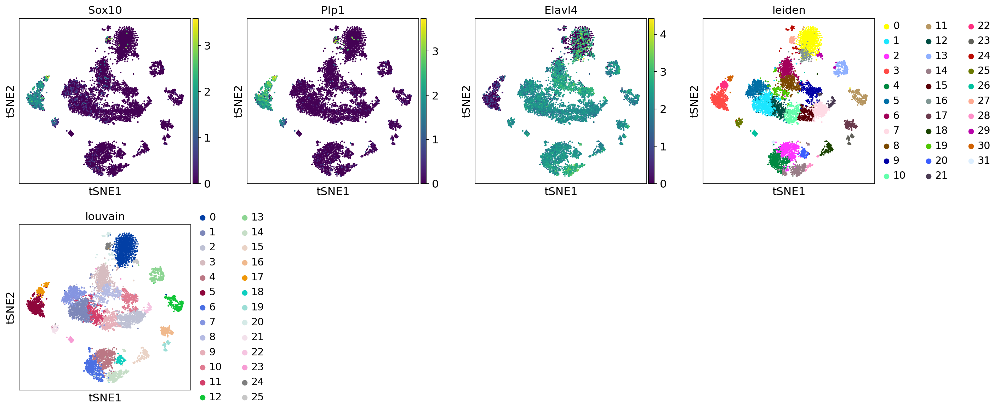

In [ ]:
sc.pl.tsne(adata, color=['Sox10', 'Plp1', 'Elavl4', 'leiden', 'louvain'])

In [ ]:
# Find marker in each cluster
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:19)


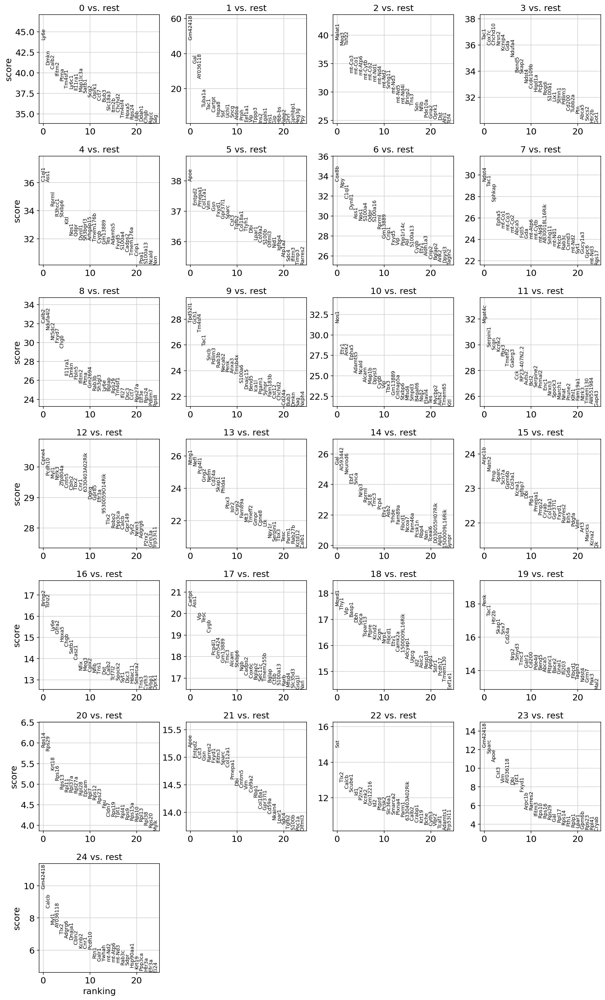

In [ ]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [ ]:
adata.write(results_file)

In [ ]:
adata = sc.read_h5ad(results_file)

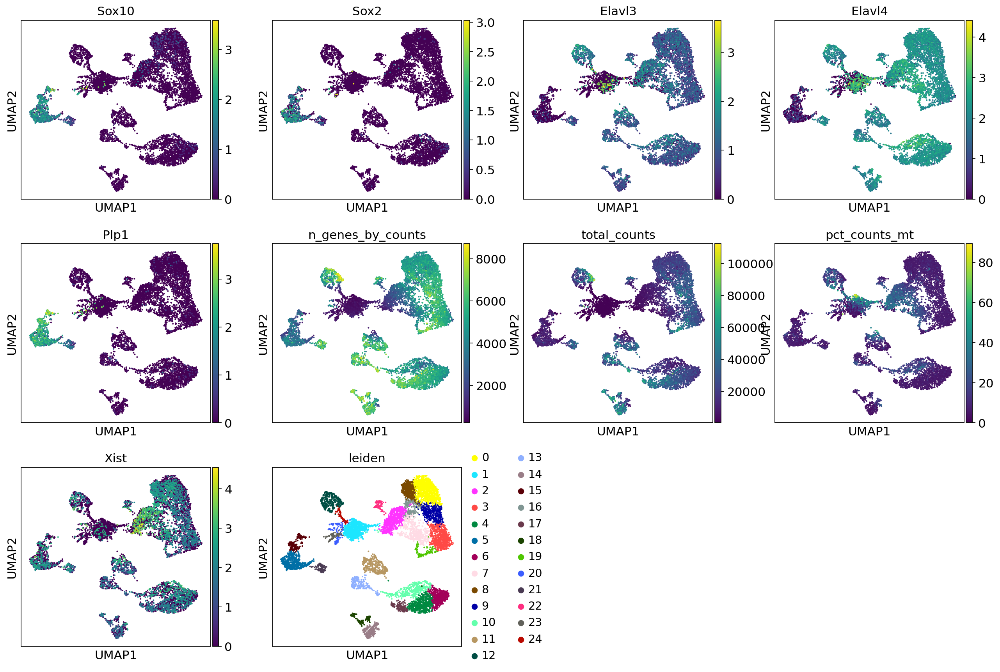

In [ ]:
sc.pl.umap(adata, color=['Sox10', 'Sox2', 'Elavl3', 'Elavl4', 'Plp1', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'Xist', 'leiden'])

# Finding

## Cluster 5, 15, and 21 are glial cells as Sox2/10 are highly expressed while the expression of Elavl3/4 are minimal in these clusters. Clusters that are suspected to be neurons are 0, 1, 3, 4, 6, 7, 8, 9, 11, 12, 13, 14, 16, 17, 18, 19, 22, and 24


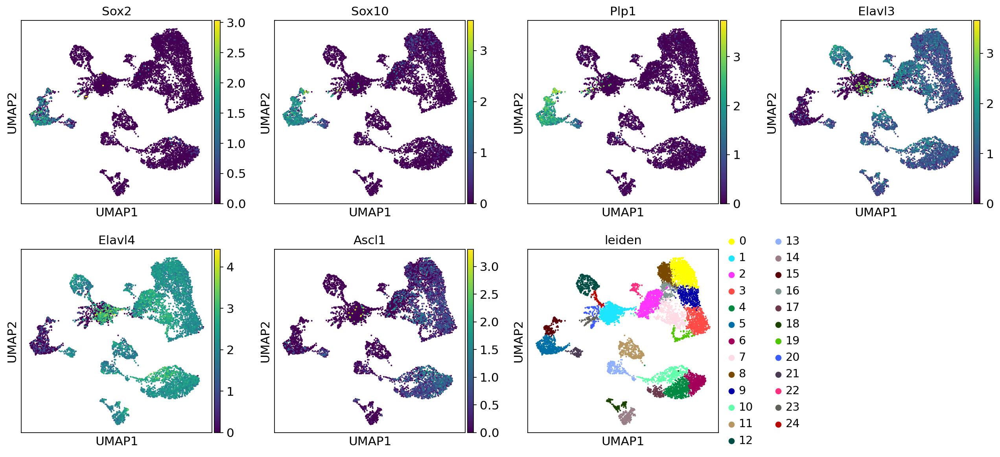

In [ ]:
sc.pl.umap(adata, color=['Sox2', 'Sox10', 'Plp1', 'Elavl3', 'Elavl4', 'Ascl1', 'leiden'])

## Cluster 4, 6, 12, 14, 17, and 18 are inhibitory motor neurons since Gal is heghly expressed in these clusters but not Calb2. Thus, cluster 0, 8, 9, 12, 26, and 24 are excitatory motor neurons. This is because the mentioned clusters highly express Calb2 but not Gal.

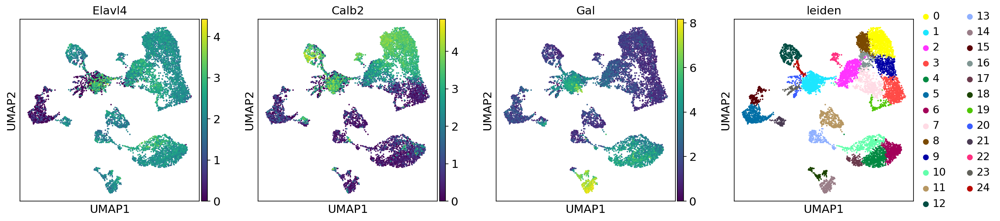

In [ ]:
sc.pl.umap(adata, color=['Elavl4', 'Calb2', 'Gal', 'leiden'])

## Cluster 1 contains bad cells as it has high percent count of 'mt-' genes with low total counts and low number of genes by cell counts. Interestingly, Cox8b, a unique mitochondrial gene, is found on cluster 6, where pct_counts_mt is very low.

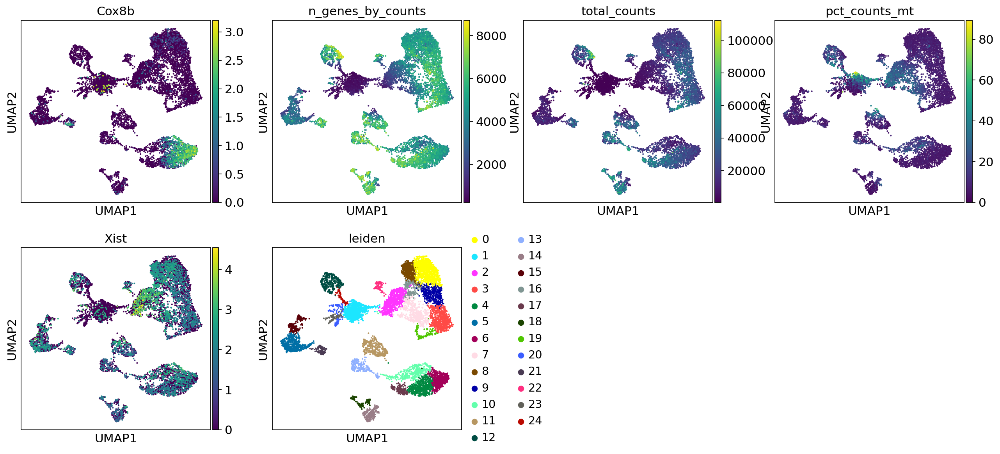

In [ ]:
sc.pl.umap(adata, color=['Cox8b', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'Xist', 'leiden'])

## Cluster 22 hyghly expresses Sst (which is a gene that indicates cell proliferation in both normall and cancer), and Ly6e (a marker for lymphocyte). This indicates that there is a immune response on the newly proliferated cells. Thus, this cluster could be cancer or tumor cells

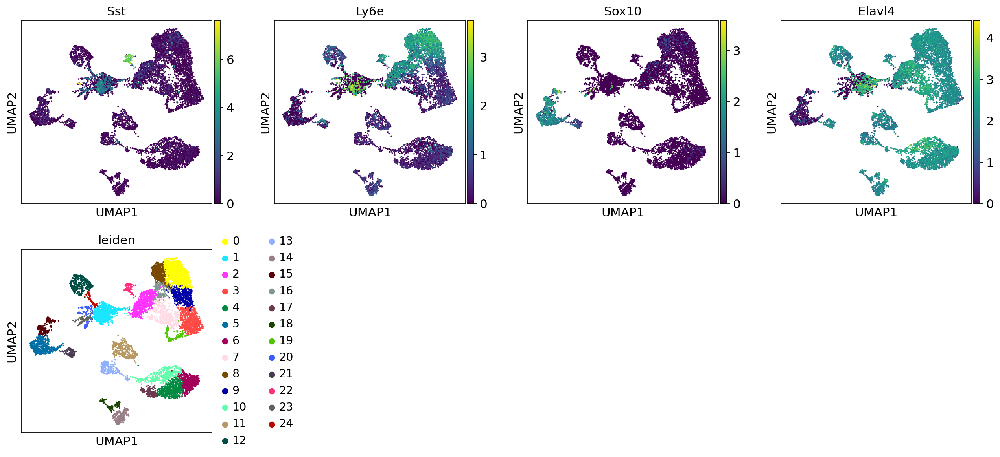

In [ ]:
sc.pl.umap(adata, color=['Sst', 'Ly6e', 'Sox10', 'Elavl4', 'leiden'])

In [ ]:
adata.write(results_file)

In [ ]:
adata.uns['rank_genes_groups']

{'logfoldchanges': array([( 3.1210494,  2.8062215,  2.2745757,  3.7673886,  4.1783724,  8.896454 ,  5.119483 ,  2.6807427,  3.6127486,  2.3921514,  4.957058 ,  7.0540075,  6.7095337,  6.6588573,  7.471059 ,  6.3007927,  2.5759864,  6.006276 ,  4.740244 ,  6.3985724,  0.6284248,  6.0757947 ,  9.601592 ,  2.566208 ,  1.784455 ),
        ( 2.6263793,  2.8914807,  2.2026966,  1.6064212,  3.2246628,  6.6423016,  5.2556815,  3.5714366,  3.9833198,  2.1627655,  3.6329033,  4.1807165,  5.1715555,  6.0206113,  6.3086615,  7.4765315,  2.128071 ,  3.6024098,  3.7115672,  4.7300024,  0.6505973,  3.614237  ,  2.3209157,  4.887285 ,  4.5786304),
        ( 3.433705 ,  2.596428 ,  2.7994828,  2.2037797,  3.9728796,  5.6060953,  3.8163297,  2.52732  ,  2.800635 ,  2.1910143,  2.093626 ,  6.0824695,  4.5177073,  6.1740036,  6.8226347,  3.1690564,  2.294474 ,  4.9935927,  5.8229284,  4.5580597,  9.919304 ,  2.6345346 ,  4.969152 ,  5.6885743,  2.7115219),
        ...,
        (-2.815367 , -3.0467725, -1.

In [ ]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
0,Ly6e,Gm42418,Malat1,Tac1,C1ql1,Apoe,Cox8b,Ndst4,Calb2,Tpd52l1,Nos1,Mgat4c,Cpne4,Ntng1,Gal,Arpc1b,Brinp2,Cartpt,Moxd1,Penk,Rps14,Apoe,Sst,Gm42418,Gm42418
1,Dmkn,Gal,Meg3,Cox7c,Ass1,Entpd2,Npy,Tac1,Ndufa4l2,Gch1,Etv1,Serpini1,Pcdh10,Nefl,AI593442,Matn2,Tshz2,Ass1,Thy1,Tac1,Rps29,Entpd2,Tlx2,Sparc,Calcb
2,Calb2,AY036118,Tshz2,Chchd10,Rprml,Pmepa1,C1ql1,Sphkap,Nt5dc2,Tm4sf4,Ank2,Scgn,Myl1,Pcp4l1,Neurod6,Prnp,Ly6e,Vip,Vip,Htr2b,Krt18,Cst3,Calcb,Apoe,Myl1
3,Ifitm2,Tuba1a,mt-Co3,Nrsn2,R3hcc1,Col12a1,Dynll1,Epha5,Fxyd7,Tac1,Epha5,Kcnk2,Ntrk3,Gng2,Ebf1,Sparc,Gfra2,Tesc,Basp1,Skap1,Rps16,Gsn,Scube1,Cst3,AY036118
4,Ptma,Tac1,mt-Co1,Kcnip4,Stxbp6,Vim,Ass1,mt-Co1,Chgb,Sncb,Adamts5,Pbx3,Zfp804a,Nefm,Snca,Scn7a,Hoxa5,Cygb,Dbh,Snx7,Rps13,Rarres2,Id1,Vim,Tlx2


In [ ]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p,6_n,6_p,7_n,7_p,8_n,8_p,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p,13_n,13_p,14_n,14_p,15_n,15_p,16_n,16_p,17_n,17_p,18_n,18_p,19_n,19_p,20_n,20_p,21_n,21_p,22_n,22_p,23_n,23_p,24_n,24_p
0,Ly6e,0.0,Gm42418,0.000000e+00,Malat1,0.000000e+00,Tac1,3.718563e-290,C1ql1,1.653374e-285,Apoe,0.000000e+00,Cox8b,4.511356e-246,Ndst4,2.094401e-190,Calb2,3.808119e-226,Tpd52l1,2.505215e-169,Nos1,7.455880e-218,Mgat4c,1.033662e-220,Cpne4,5.479859e-199,Ntng1,2.489982e-143,Gal,1.397873e-141,Arpc1b,3.251182e-124,Brinp2,3.562627e-61,Cartpt,3.112493e-92,Moxd1,8.763044e-69,Penk,1.146738e-71,Rps14,3.623213e-09,Apoe,4.455239e-52,Sst,7.069122e-50,Gm42418,1.121840e-34,Gm42418,8.821850e-23
1,Dmkn,0.0,Gal,3.498565e-261,Meg3,0.000000e+00,Cox7c,5.683356e-284,Ass1,6.625338e-285,Entpd2,5.002933e-303,Npy,2.856371e-237,Tac1,2.671792e-184,Ndufa4l2,9.746542e-216,Gch1,1.199174e-168,Etv1,7.519661e-169,Serpini1,1.089606e-195,Pcdh10,3.352750e-194,Nefl,3.602271e-142,AI593442,5.326812e-137,Matn2,3.850649e-122,Tshz2,1.784972e-60,Ass1,1.507474e-91,Thy1,1.293666e-67,Tac1,5.332749e-67,Rps29,6.400801e-09,Entpd2,7.953306e-51,Tlx2,6.248770e-38,Sparc,2.503913e-31,Calcb,6.542073e-18
2,Calb2,0.0,AY036118,9.292980e-146,Tshz2,0.000000e+00,Chchd10,8.800859e-284,Rprml,2.421129e-258,Pmepa1,2.294755e-302,C1ql1,1.827527e-221,Sphkap,9.074253e-167,Nt5dc2,1.377171e-201,Tm4sf4,9.845332e-161,Ank2,2.842971e-166,Scgn,4.827109e-193,Myl1,4.703986e-193,Pcp4l1,3.410272e-137,Neurod6,9.872461e-135,Prnp,2.635635e-119,Ly6e,4.894475e-53,Vip,1.972285e-86,Vip,3.104004e-66,Htr2b,1.362667e-63,Krt18,9.187906e-08,Cst3,9.802574e-51,Calcb,4.932502e-36,Apoe,9.425656e-27,Myl1,2.779869e-14
3,Ifitm2,0.0,Tuba1a,1.104599e-21,mt-Co3,5.036193e-244,Nrsn2,1.885661e-283,R3hcc1,1.143624e-247,Col12a1,2.872021e-301,Dynll1,6.873628e-207,Epha5,1.806609e-141,Fxyd7,6.546742e-198,Tac1,2.070683e-148,Epha5,1.513378e-160,Kcnk2,3.227285e-191,Ntrk3,1.874758e-192,Gng2,9.746583e-132,Ebf1,4.373487e-128,Sparc,4.463529e-119,Gfra2,4.507226e-52,Tesc,1.780706e-85,Basp1,1.416400e-65,Skap1,2.536943e-59,Rps16,3.602897e-07,Gsn,1.595964e-50,Scube1,5.592668e-35,Cst3,2.538151e-19,AY036118,1.252317e-13
4,Ptma,0.0,Tac1,2.758618e-15,mt-Co1,1.059713e-241,Kcnip4,1.134696e-277,Stxbp6,3.252324e-247,Vim,1.084258e-300,Ass1,3.633123e-194,mt-Co1,1.166642e-138,Chgb,1.715651e-190,Sncb,2.797633e-136,Adamts5,1.857575e-141,Pbx3,1.480762e-186,Zfp804a,7.496868e-190,Nefm,9.867515e-132,Snca,1.456617e-127,Scn7a,2.508260e-118,Hoxa5,1.330965e-49,Cygb,1.187319e-81,Dbh,4.384674e-64,Snx7,4.690467e-59,Rps13,1.060079e-06,Rarres2,2.384200e-50,Id1,5.945735e-34,Vim,2.594723e-17,Tlx2,2.458735e-12


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


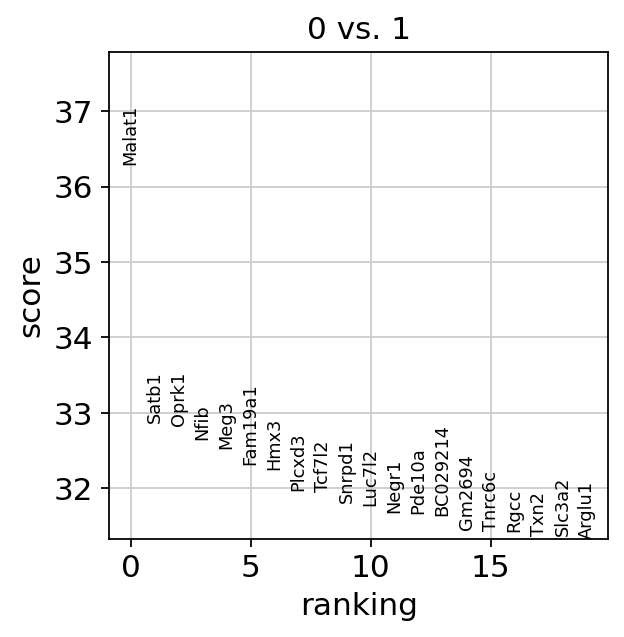

In [ ]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)